# Observation des lignes de courant de vent — large300 (Méso-NH RCE)

**Objectif** On a montré que paramétriser le flux de Reynolds $\rho_0\langle u'w'\rangle$ par le seul flux de masse (bulk-plume) est insuffisant : le résidu sous-maille $T_2$ est irréductible ($\sim 44\%$) et structurellement corrélé au flux total. 

**Nouvelle piste.** Regarder directement la *structure spatiale* de l'écoulement via les **lignes de courant** dans le plan $(x,z)$, coupe moyennée sur $y$, et la **confronter à la corrélation** $u'w'$.

---
### Trame 
1. **Calcul de la fonction de courant** $\psi$ (isolignes) — convention de masse anélastique.
2. **Coupe verticale moyennée sur $y$** à $t$ donné (et moyenne temporelle).
3. **Comment voit-on la faible corrélation $u'w'$ ?** — superposer streamlines et carte de $u'w'$.
4. **Que tirer de la visualisation ?** — diagnostics quantitatifs.
5. **Lien avec la paramétrisation du flux de Reynolds.**
6. **Décomposition du courant en ondelettes / Fourier** — échelles dominantes.
7. **Extension aux lignes de courant 3D.**
8. **Isolation des tourbillons** (critère $\lambda_2$ / vorticité / Okubo-Weiss).
9. **Autres idées** 

#  Les lignes de courant

À un instant donné, en chaque point de l'espace, le vent est un **vecteur** $\vec{V}=(u,w)$ (ici dans le plan vertical $(x,z)$). Une **ligne de courant** (*streamline*) est une courbe qui est, partout, **tangente à ce vecteur vitesse**.

Tracer des lignes tangentes au champ « à la main » serait pénible. Il existe un **raccourci mathématique** très puissant, à une condition.

**La condition : un écoulement incompressible (sans création ni perte de matière).** En 2D, cela s'écrit « la divergence est nulle » :
$$\frac{\partial u}{\partial x} + \frac{\partial w}{\partial z} = 0.$$

**Le théorème.** Quand cette condition est vraie, il existe une **fonction scalaire** $\psi(x,z)$ — un simple nombre attaché à chaque point — telle que les deux composantes de la vitesse sont ses dérivées :
$$u = -\frac{\partial \psi}{\partial z}, \qquad w = +\frac{\partial \psi}{\partial x}.$$
Cette $\psi$ s'appelle la **fonction de courant**.

 On peut vérifier que le long d'une courbe où $\psi$ reste constant, le déplacement est exactement tangent à $\vec V$. Autrement dit :
$$\boxed{\text{les lignes de courant} = \text{les lignes de niveau (isolignes) de } \psi.}$$
Tracer les lignes de courant revient donc à tracer un simple **contour** de $\psi$ (comme les courbes de niveau d'une carte topographique). Un `plt.contour(psi)` suffit.

Bonus : la **différence de $\psi$** entre deux lignes donne le **débit** qui passe entre elles. Resserrement des isolignes ⇔ écoulement intense.

---
## Étape 3 — Le cas de l'atmosphère : fonction de courant **de masse**

L'air n'est pas incompressible : sa densité $\rho_0(z)$ **chute avec l'altitude** (l'air est plus dense en bas). La divergence de la vitesse n'est donc pas nulle.

**La bonne quantité conservée** n'est pas le volume mais la **masse**. L'approximation *anélastique* (standard en convection) dit que c'est le **flux de masse** $(\rho_0 u,\ \rho_0 w)$ qui est sans divergence :
$$\frac{\partial (\rho_0\, u)}{\partial x} + \frac{\partial (\rho_0\, w)}{\partial z} = 0.$$
On définit alors une **fonction de courant de masse** $\psi$ par :
$$\rho_0\, u = -\frac{\partial \psi}{\partial z}, \qquad \rho_0\, w = +\frac{\partial \psi}{\partial x}.$$
Ses isolignes sont les lignes de courant du **transport de masse** — exactement ce qui décrit la circulation de retournement (*overturning*) de la convection.

---
## Étape 4 — Pourquoi pas une simple intégration ? (le piège)

Naïvement, on pourrait obtenir $\psi$ en **intégrant** : par exemple, partir de $w = \frac{1}{\rho_0}\partial_x\psi$ et cumuler $\psi(x,z) = \int_0^x \rho_0\, w\,dx'$.

**Le problème :** cette recette suppose que la condition de divergence nulle est *parfaitement* vérifiée. Or nos données réelles ne le sont jamais exactement : on a moyenné sur un $y$ de taille finie, il y a du bruit turbulent, et la grille est discrète. Du coup :
- intégrer **horizontalement** ($\int \rho_0 w\, dx$) ou **verticalement** ($-\int \rho_0 u\, dz$) donne **deux résultats différents** ;
- le résultat **dépend du chemin** suivi pour intégrer. Ce n'est pas acceptable.

---
## Étape 5 — La solution propre : décomposition de Helmholtz + équation de Poisson

Tout champ de vecteurs se décompose de façon unique (théorème de **Helmholtz**) en deux morceaux :
$$\text{flux de masse} = \underbrace{\text{partie rotationnelle}}_{\text{tourne, porte la circulation}} + \underbrace{\text{partie divergente}}_{\text{source/puits, pas de circulation}}.$$
Seule la **partie rotationnelle** correspond à une vraie fonction de courant. On veut donc l'extraire proprement et **jeter** le reste.

Pour cela on introduit la **vorticité** (le « taux de rotation local » de l'écoulement). En appliquant l'opérateur rotationnel à la définition de $\psi$, les deux relations $\rho_0 u=-\partial_z\psi$ et $\rho_0 w=+\partial_x\psi$ se combinent en **une seule équation** :
$$\boxed{\nabla^2\psi \;=\; \frac{\partial(\rho_0 w)}{\partial x} - \frac{\partial(\rho_0 u)}{\partial z}}$$
où $\nabla^2 = \partial_x^2 + \partial_z^2$ est le **Laplacien**. C'est une **équation de Poisson** : le membre de droite (calculable directement à partir des données $u,w$) est connu, et on cherche $\psi$.

**Comment on la résout numériquement ?**
1. On calcule le membre de droite (la vorticité de masse) par différences finies.
2. On écrit le Laplacien comme une grande **matrice creuse** (chaque point relié à ses 4 voisins).
3. On impose une **condition au bord** : ici $\psi=0$ sur le contour du domaine (Dirichlet). *(À adapter en périodique si le domaine l'est — voir remarque en fin de notebook.)*
4. On résout le système linéaire $A\,\psi = b$ en une fois (`scipy.sparse.linalg.spsolve`).

**Le résultat** est un $\psi$ **unique** et **indépendant du chemin** : la résolution projette automatiquement le champ sur sa partie rotationnelle et laisse de côté la partie divergente.

---
###  Résumé
> Une ligne de courant est une isoligne de la fonction de courant $\psi$ ; en atmosphère on travaille avec $\psi$ **de masse** ($\rho_0 u=-\partial_z\psi$, $\rho_0 w=+\partial_x\psi$) ; et pour l'obtenir proprement sur des données réelles on **résout une équation de Poisson** $\nabla^2\psi=\partial_x(\rho_0 w)-\partial_z(\rho_0 u)$ plutôt que d'intégrer naïvement.

## 0. Imports & configuration

Calé sur le pipeline **large300** : fichiers 3D séparés par variable dans `3D/MESONH_RCE_large300_3D_{var}.nc` (variables `ua`,`va`,`wa`,`ta`,`pa`,`hus`), altitude reprise du 1D, état stationnaire = **dernier tiers** des pas de temps, $\rho_0(z)$ calculé via la température virtuelle. Lecture **niveau par niveau** pour la RAM.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
import xarray as xr
import gc, os

plt.rcParams.update({
    'figure.dpi': 110, 'font.size': 11,
    'axes.grid': True, 'grid.alpha': 0.25,
    'image.cmap': 'RdBu_r',
})

# ============================================================
#  CONFIGURATION  (identique au notebook rcemip_large300)
# ============================================================
DIR_3D = '3D';  DIR_2D = '2D';  DIR_1D = '1D'
def path3d(var): return os.path.join(DIR_3D, f'MESONH_RCE_large300_3D_{var}.nc')
def path1d(var): return os.path.join(DIR_1D, f'MESONH_RCE_large300_1D_{var}.nc')

Rd, Rv = 287.05, 461.5
EPSILON = Rd / Rv          # ≈ 0.622
BLOC    = 2                # taille de bloc temporel (RAM)

USE_SYNTHETIC = False      # True = champ jouet (démo sans données) ; False = large300

# Résolution horizontale large300 (mêmes valeurs que le pipeline rcemip).
# Forcée à 2000 m si les coordonnées sont des indices entiers.
DX_DEFAULT = 1000.0        # m

print('Config prête. USE_SYNTHETIC =', USE_SYNTHETIC)

Config prête. USE_SYNTHETIC = False


## 1. Chargement large300 : coupe $(x,z)$ moyennée sur $y$ et sur le temps

On construit la coupe 2D $(z,x)$ en moyennant **sur $y$** (révèle l'overturning) **et sur le temps** (état stationnaire). En parallèle on accumule $\langle u'w'\rangle$ moyenné de la même façon, avec la **même convention d'anomalie spatiale** $(y,x)$ par niveau que ton pipeline.

Trois étapes : (1a) métadonnées + altitude, (1b) profil $\rho_0(z)$ via $T_v$, (1c) coupes moyennées niveau par niveau.

In [2]:
# --- (1a) Métadonnées : dims, tailles, altitude, fenêtre stationnaire ---
if not USE_SYNTHETIC:
    _ds = xr.open_dataset(path3d('ua'));  _da = _ds['ua']
    dim_t, dim_z, dim_y, dim_x = _da.dims        # ordre (t, z, y, x)
    n_t = _da.sizes[dim_t];  n_z = _da.sizes[dim_z]
    n_y = _da.sizes[dim_y];  n_x = _da.sizes[dim_x]
    _ds.close();  del _ds, _da;  gc.collect()

    # altitude depuis le fichier 1D (plus fiable que la coord brute)
    _t1 = xr.open_dataset(path1d('ua_avg'))
    alt = _t1['altitude'].values.astype(float).copy()
    _t1.close()

    t_stat   = int(2 * n_t / 3)          # dernier tiers = stationnaire
    idx_stat = slice(t_stat, None)
    n_stat   = n_t - t_stat
    print(f'Grille : {n_t} t × {n_z} z × {n_y} y × {n_x} x')
    print(f'Altitude : {alt[0]:.0f} → {alt[-1]:.0f} m')
    print(f'Stationnaire : t={t_stat}→{n_t-1} ({n_stat} pas)')

Grille : 100 t × 74 z × 128 y × 2000 x
Altitude : 0 → 32500 m
Stationnaire : t=66→99 (34 pas)


In [3]:
# --- (1b) Profil rho_0(z) via température virtuelle (gaz parfaits) ---
if not USE_SYNTHETIC:
    rho0_sum = np.zeros(n_z);  n_rho = 0
    ds_ta  = xr.open_dataset(path3d('ta'))
    ds_pa  = xr.open_dataset(path3d('pa'))
    ds_hus = xr.open_dataset(path3d('hus'))
    for t0 in range(t_stat, n_t, BLOC):
        t1 = min(t0 + BLOC, n_t);  sl = {dim_t: slice(t0, t1)}
        T_blk  = ds_ta['ta'].isel(sl).values
        p_blk  = ds_pa['pa'].isel(sl).values
        qv_blk = ds_hus['hus'].isel(sl).values
        Tv_blk  = T_blk * (1.0 + qv_blk/EPSILON) / (1.0 + qv_blk)
        rho_blk = p_blk / (Rd * Tv_blk)
        rho0_sum += rho_blk.mean(axis=(0, 2, 3)) * (t1 - t0)
        n_rho    += (t1 - t0)
        del T_blk, p_blk, qv_blk, Tv_blk, rho_blk;  gc.collect()
    ds_ta.close();  ds_pa.close();  ds_hus.close()
    del ds_ta, ds_pa, ds_hus;  gc.collect()
    rho0 = rho0_sum / n_rho
    print(f'ρ₀ : surface {rho0[0]:.3f} → sommet {rho0[-1]:.4f} kg/m³ '
          f'({n_rho} pas)')

ρ₀ : surface 1.183 → sommet 0.0104 kg/m³ (34 pas)


In [4]:
# --- (1c) Coupes (z,x) moyennées sur y ET sur le temps stationnaire ---
#   U, W      : <.>_{y,t}                      -> pour psi (lignes de courant)
#   UPWP      : <u'w'>_{y,t}  (anomalie (y,x)) -> flux de Reynolds local (z,x)
#   ubar,wbar : <.>_{x,y,t}                    -> profils pour diagnostics
if not USE_SYNTHETIC:
    z = alt.copy()
    # --- résolution horizontale : lue depuis les coords, sinon DX_DEFAULT ---
    _dsx = xr.open_dataset(path3d('ua'))
    _xv = _dsx['ua'][dim_x].values
    print(_xv)
    dx = float(np.mean(np.diff(_xv)))
    _dsx.close(); del _dsx, _xv
    if abs(dx) <= 1.5:           # coords = indices entiers -> vraie résolution
        dx = DX_DEFAULT
    x = np.arange(n_x, dtype=float) * dx        # axe x en MÈTRES
    print(f'Résolution horizontale dx = {dx:.0f} m  (domaine {n_x*dx/1000:.0f} km)')
    U  = np.zeros((n_z, n_x));  W = np.zeros((n_z, n_x))
    UPWP = np.zeros((n_z, n_x))
    ubar = np.zeros(n_z);  wbar = np.zeros(n_z)

    # niveaux cibles où l'on garde une tranche 2D (y,x) pour le co-spectre
    Z_TARGETS = [5000., 10000., 15000.]   # m
    slices2d = {}                          # iz -> (u_p2d, w_p2d) moyennés en t
    iz_targets = [int(np.argmin(np.abs(alt - zt))) for zt in Z_TARGETS]

    ds_u = xr.open_dataset(path3d('ua'))
    ds_w = xr.open_dataset(path3d('wa'))
    for iz in range(n_z):
        sl = {dim_t: idx_stat, dim_z: iz}
        u_lev = ds_u['ua'].isel(sl).values     # (n_stat, ny, nx)
        w_lev = ds_w['wa'].isel(sl).values
        # anomalie spatiale (y,x) par pas de temps -> convention pipeline
        u_p = u_lev - u_lev.mean(axis=(1, 2), keepdims=True)
        w_p = w_lev - w_lev.mean(axis=(1, 2), keepdims=True)
        # moyennes <.>_{y,t} -> profils en x
        U[iz]    = u_lev.mean(axis=(0, 1))      # moyenne sur t puis y
        W[iz]    = w_lev.mean(axis=(0, 1))
        UPWP[iz] = (u_p * w_p).mean(axis=(0, 1))
        ubar[iz] = u_lev.mean();  wbar[iz] = w_lev.mean()
        if iz in iz_targets:                 # tranche (y,x) moyennée sur t
            slices2d[iz] = (u_p.mean(axis=0), w_p.mean(axis=0))
        del u_lev, w_lev, u_p, w_p;  gc.collect()
        if iz % 10 == 0: print(f'  niveau {iz}/{n_z-1} ({alt[iz]:.0f} m)')
    ds_u.close();  ds_w.close();  del ds_u, ds_w;  gc.collect()

    upwp = UPWP                               # alias attendu par la suite
    print('Coupes (z,x) prêtes :', U.shape)
    ZMIN, ZMAX = 2000., 18000.        # en mètres (z = alt est en m)
    kz = (z >= ZMIN) & (z <= ZMAX)
    z    = z[kz]
    rho0 = rho0[kz]
    U    = U[kz];   W = W[kz];   UPWP = UPWP[kz]
    ubar = ubar[kz];  wbar = wbar[kz]
    upwp = UPWP
    n_z  = z.size
    print(f'Restreint à {z[0]:.0f}–{z[-1]:.0f} m : {n_z} niveaux')

[   0    1    2 ... 1997 1998 1999]
Résolution horizontale dx = 1000 m  (domaine 2000 km)
  niveau 0/73 (0 m)
  niveau 10/73 (1331 m)
  niveau 20/73 (6000 m)
  niveau 30/73 (11000 m)
  niveau 40/73 (16000 m)
  niveau 50/73 (21000 m)
  niveau 60/73 (26000 m)
  niveau 70/73 (31000 m)
Coupes (z,x) prêtes : (74, 2000)
Restreint à 2055–18000 m : 33 niveaux


In [5]:
# --- Repli synthétique (uniquement si USE_SYNTHETIC=True) : champ jouet ---
#     overturning sinusoïdal + panaches + bruit. Sert à exécuter le notebook
#     sans les NetCDF. NE PAS interpréter physiquement.
if USE_SYNTHETIC:
    rng = np.random.default_rng(0)
    n_z, n_x = 74, 256
    z = np.linspace(0, 20000, n_z);  x = np.linspace(0, 300000, n_x)
    XX, ZZ = np.meshgrid(x, z);  rho0 = 1.2*np.exp(-z/8000.)
    H, L = z.max(), x.max()
    psi0 = 4e3*np.sin(np.pi*ZZ/H)*np.sin(2*np.pi*XX/L)
    dz = z[1]-z[0];  dx = x[1]-x[0]
    W = np.gradient(psi0, dx, axis=1)/rho0[:,None]
    U = -np.gradient(psi0, dz, axis=0)/rho0[:,None]
    for xc in rng.uniform(0, L, 6):
        W += rng.uniform(3,8)*np.exp(-((XX-xc)/6000.)**2)*np.sin(np.pi*ZZ/H)
    U += 0.5*rng.standard_normal(U.shape);  W += 0.3*rng.standard_normal(W.shape)
    ubar = U.mean(axis=1);  wbar = W.mean(axis=1)
    upwp = (U-ubar[:,None])*(W-wbar[:,None])
    print('⚠️ MODE SYNTHÉTIQUE — données fabriquées, non physiques.')
    print('Grille (nz,nx) =', U.shape)

## 1bis. Fonction de courant de masse $\psi$ — résolution propre par Poisson

**Chaîne logique.** En anélastique, la continuité sur le champ moyenné en $y$ s'écrit
$$\partial_x(\rho_0\bar u) + \partial_z(\rho_0\bar w) = 0,$$
c.-à-d. le couple flux de masse $(\rho_0\bar u,\,\rho_0\bar w)$ est à **divergence nulle**. Cette nullité garantit l'existence d'une fonction de courant $\psi$ telle que
$$\rho_0\,\bar u = -\partial_z\psi,\qquad \rho_0\,\bar w = +\partial_x\psi.$$
Les **isolignes de $\psi$ sont les lignes de courant** (le flux de masse leur est tangent).

**Pourquoi pas une simple intégration ?** Le champ réel (moyenné sur un $y$ fini, bruité, discret) n'est *jamais* exactement non-divergent. Intégrer $\rho_0\bar w$ en $x$ ou $-\rho_0\bar u$ en $z$ donne alors des résultats **dépendants du chemin**. Il faut extraire proprement la seule partie qui porte une circulation.

**Décomposition de Helmholtz + Poisson.** On scinde le flux de masse en partie rotationnelle (la circulation) + partie divergente (le résidu, qu'on écarte). En prenant le rotationnel de la définition de $\psi$ on obtient une **équation de Poisson** :
$$\nabla^2\psi = \partial_x(\rho_0\bar w) - \partial_z(\rho_0\bar u) \;\equiv\; \omega_{\text{masse}},$$
avec $\psi=0$ au bord (Dirichlet). Sa solution est **unique, indépendante du chemin**, et projette automatiquement hors de la partie divergente.

In [25]:
from scipy.sparse import diags, kron, identity
from scipy.sparse.linalg import spsolve

def mass_streamfunction(U, W, x, z, rho0):
    """Fonction de courant de masse par résolution de Poisson (Dirichlet).
    Résout  nabla^2 psi = d_x(rho0 W) - d_z(rho0 U)  avec psi=0 au bord.
    psi est unique et indépendant du chemin d'intégration ; la partie
    divergente du flux de masse est automatiquement projetée hors de psi.
    Renvoie (psi, frac_div) où frac_div = fraction divergente écartée."""
    nz, nx = U.shape
    dx = float(x[1]-x[0]);  dz = float(z[1]-z[0])
    rhoU = rho0[:, None] * U
    rhoW = rho0[:, None] * W
    # vorticité de masse = terme source du Poisson
    omega = (np.gradient(rhoW, dx, axis=1) - np.gradient(rhoU, dz, axis=0))
    # Laplacien 2D sur les noeuds intérieurs (Dirichlet psi=0 au bord)
    Ix = identity(nx-2);  Iz = identity(nz-2)
    Lx = diags([1., -2., 1.], [-1, 0, 1], shape=(nx-2, nx-2)) / dx**2
    Lz = diags([1., -2., 1.], [-1, 0, 1], shape=(nz-2, nz-2)) / dz**2
    A = (kron(Iz, Lx) + kron(Lz, Ix)).tocsr()
    psi = np.zeros((nz, nx))
    psi[1:-1, 1:-1] = spsolve(A, omega[1:-1, 1:-1].ravel()).reshape(nz-2, nx-2)
    return psi

psi = mass_streamfunction(U, W, x, z, rho0)


## 2-3. Visualisation : lignes de courant + faible corrélation $u'w'$

On superpose :
- les **isolignes de $\psi$** (lignes de courant de masse) ;
- en fond couleur, le **flux de Reynolds local** $u'w'$.

👉 Le point clé pour répondre à *« comment voit-on la faible corrélation ? »* : la cellule d'overturning (lignes de courant bien organisées) coexiste avec un champ $u'w'$ qui **change de signe** / se compense spatialement. Visuellement l'organisation est nette, mais l'intégrale (la corrélation moyenne) reste faible car les contributions $+$ et $-$ s'annulent.

/tmp/ipykernel_36332/527007892.py:61: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pc = ax.pcolormesh(Xkm, Zkm, W_i, shading='auto',
/tmp/ipykernel_36332/527007892.py:69: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pc = ax.pcolormesh(Xkm, Zkm, UP_i, shading='auto',


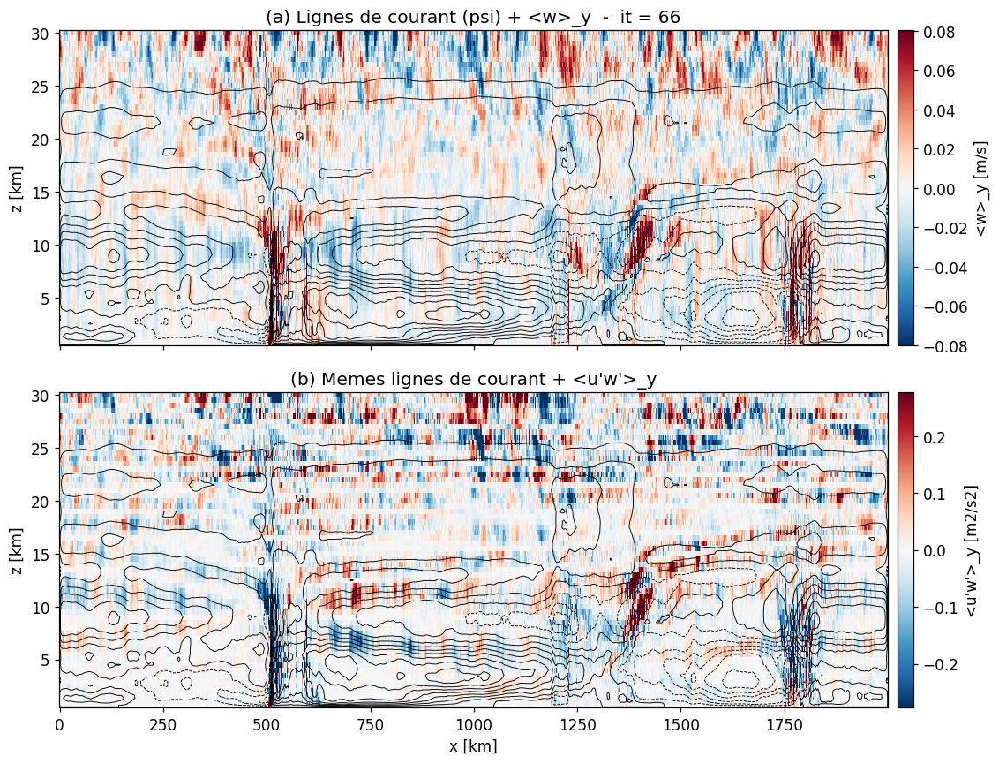

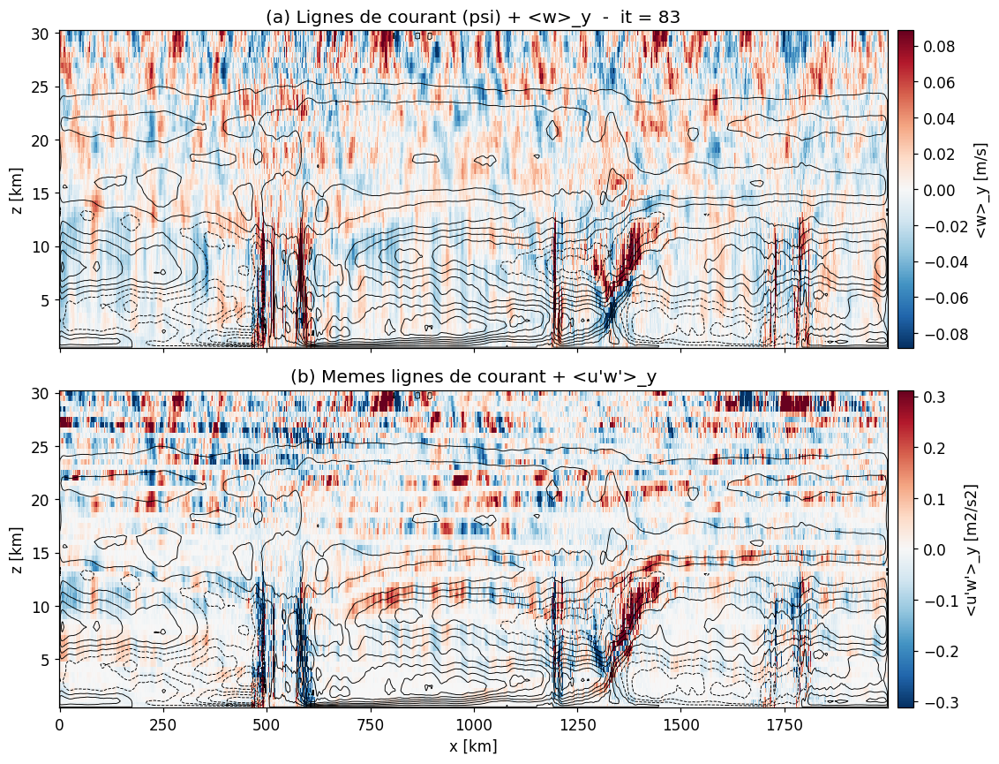

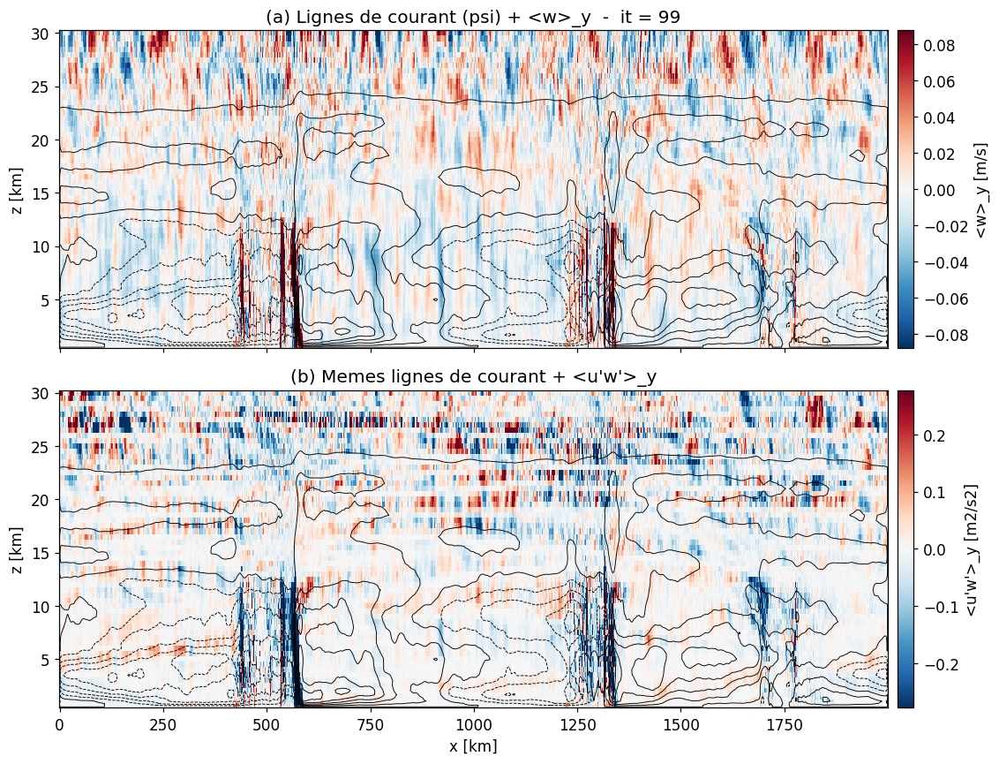

In [7]:
# ======================================================================
#  Coupes (z,x) à des instants t donnés — moyennées sur y SEULEMENT
#  Version autonome : ne dépend que de dim_t, dim_z, dim_x, n_t, n_x,
#  alt, t_stat, n_stat, x, path3d. Recalcule rho0 et tout le reste.
# ======================================================================
from scipy.sparse import diags, kron, identity
from scipy.sparse.linalg import spsolve

ZMIN, ZMAX = 500., 30000.
T_SNAPS = [t_stat, t_stat + n_stat//2, n_t - 1]   # instants à tracer

# --- rho0 sur la grille COMPLETE (au cas où il aurait été tronqué ailleurs) ---
_nz_full = alt.size
rho0_full = np.zeros(_nz_full); _nr = 0
_da = xr.open_dataset(path3d('ta')); _dp = xr.open_dataset(path3d('pa')); _dh = xr.open_dataset(path3d('hus'))
for t0 in range(t_stat, n_t, BLOC):
    t1 = min(t0+BLOC, n_t); sl = {dim_t: slice(t0,t1)}
    T = _da['ta'].isel(sl).values; P = _dp['pa'].isel(sl).values; Q = _dh['hus'].isel(sl).values
    Tv = T*(1.0+Q/EPSILON)/(1.0+Q)
    rho0_full += (P/(Rd*Tv)).mean(axis=(0,2,3))*(t1-t0); _nr += (t1-t0)
    del T,P,Q,Tv; gc.collect()
_da.close(); _dp.close(); _dh.close(); del _da,_dp,_dh; gc.collect()
rho0_full /= _nr

kz = (alt >= ZMIN) & (alt <= ZMAX)        # masque vertical 2-18 km

def coupe_instant(it):
    U_i = np.zeros((_nz_full, n_x)); W_i = np.zeros((_nz_full, n_x)); UP_i = np.zeros((_nz_full, n_x))
    du = xr.open_dataset(path3d('ua')); dw = xr.open_dataset(path3d('wa'))
    for iz in range(_nz_full):
        u_yx = du['ua'].isel({dim_t: it, dim_z: iz}).values
        w_yx = dw['wa'].isel({dim_t: it, dim_z: iz}).values
        u_p = u_yx - u_yx.mean(); w_p = w_yx - w_yx.mean()
        U_i[iz] = u_yx.mean(axis=0); W_i[iz] = w_yx.mean(axis=0)
        UP_i[iz] = (u_p*w_p).mean(axis=0)
        del u_yx, w_yx, u_p, w_p
    du.close(); dw.close(); del du, dw; gc.collect()
    return alt[kz], rho0_full[kz], U_i[kz], W_i[kz], UP_i[kz]

def psi_poisson(U_i, W_i, x, z_i, rho_i):
    nz, nx = U_i.shape
    dxl = float(x[1]-x[0]); dzl = float(z_i[1]-z_i[0])
    rhoU = rho_i[:,None]*U_i; rhoW = rho_i[:,None]*W_i
    omega = np.gradient(rhoW, dxl, axis=1) - np.gradient(rhoU, dzl, axis=0)
    Ix = identity(nx-2); Iz = identity(nz-2)
    Lx = diags([1.,-2.,1.],[-1,0,1],shape=(nx-2,nx-2))/dxl**2
    Lz = diags([1.,-2.,1.],[-1,0,1],shape=(nz-2,nz-2))/dzl**2
    A = (kron(Iz,Lx)+kron(Lz,Ix)).tocsr()
    psi = np.zeros((nz,nx))
    psi[1:-1,1:-1] = spsolve(A, omega[1:-1,1:-1].ravel()).reshape(nz-2,nx-2)
    return psi

for it in T_SNAPS:
    z_i, rho_i, U_i, W_i, UP_i = coupe_instant(it)
    psi_i = psi_poisson(U_i, W_i, x, z_i, rho_i)
    Xkm, Zkm = x/1000, z_i/1000

    fig, axes = plt.subplots(2, 1, figsize=(11, 8), sharex=True)
    ax = axes[0]
    wmax = np.percentile(np.abs(W_i), 99) + 1e-12
    pc = ax.pcolormesh(Xkm, Zkm, W_i, shading='auto',
                       norm=TwoSlopeNorm(vcenter=0, vmin=-wmax, vmax=wmax), cmap='RdBu_r')
    ax.contour(Xkm, Zkm, psi_i, levels=14, colors='k', linewidths=0.6)
    ax.set_title(f"(a) Lignes de courant (psi) + <w>_y  -  it = {it}")
    ax.set_ylabel('z [km]'); fig.colorbar(pc, ax=ax, label='<w>_y [m/s]', pad=0.01)

    ax = axes[1]
    fmax = np.percentile(np.abs(UP_i), 98) + 1e-12
    pc = ax.pcolormesh(Xkm, Zkm, UP_i, shading='auto',
                       norm=TwoSlopeNorm(vcenter=0, vmin=-fmax, vmax=fmax), cmap='RdBu_r')
    ax.contour(Xkm, Zkm, psi_i, levels=14, colors='k', linewidths=0.6)
    ax.set_title("(b) Memes lignes de courant + <u'w'>_y")
    ax.set_xlabel('x [km]'); ax.set_ylabel('z [km]')
    fig.colorbar(pc, ax=ax, label="<u'w'>_y [m2/s2]", pad=0.01)
    plt.tight_layout(); plt.show()

/tmp/ipykernel_36332/2023836086.py:61: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pc = ax.pcolormesh(Xkm, Zkm, W_i, shading='auto',
/tmp/ipykernel_36332/2023836086.py:69: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pc = ax.pcolormesh(Xkm, Zkm, UP_i, shading='auto',


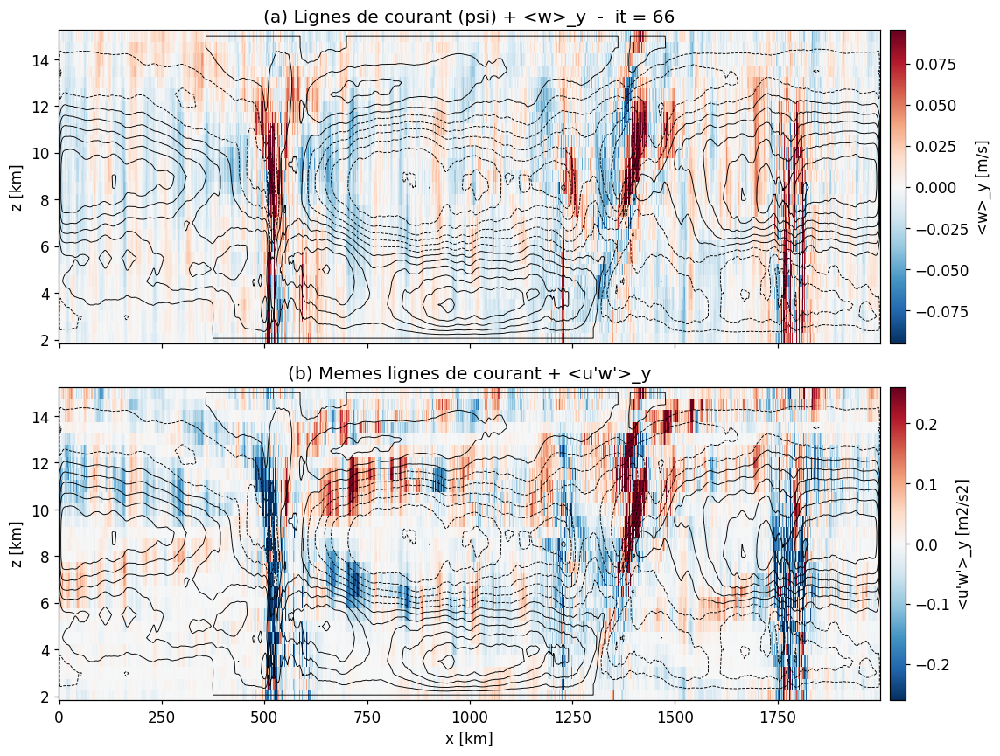

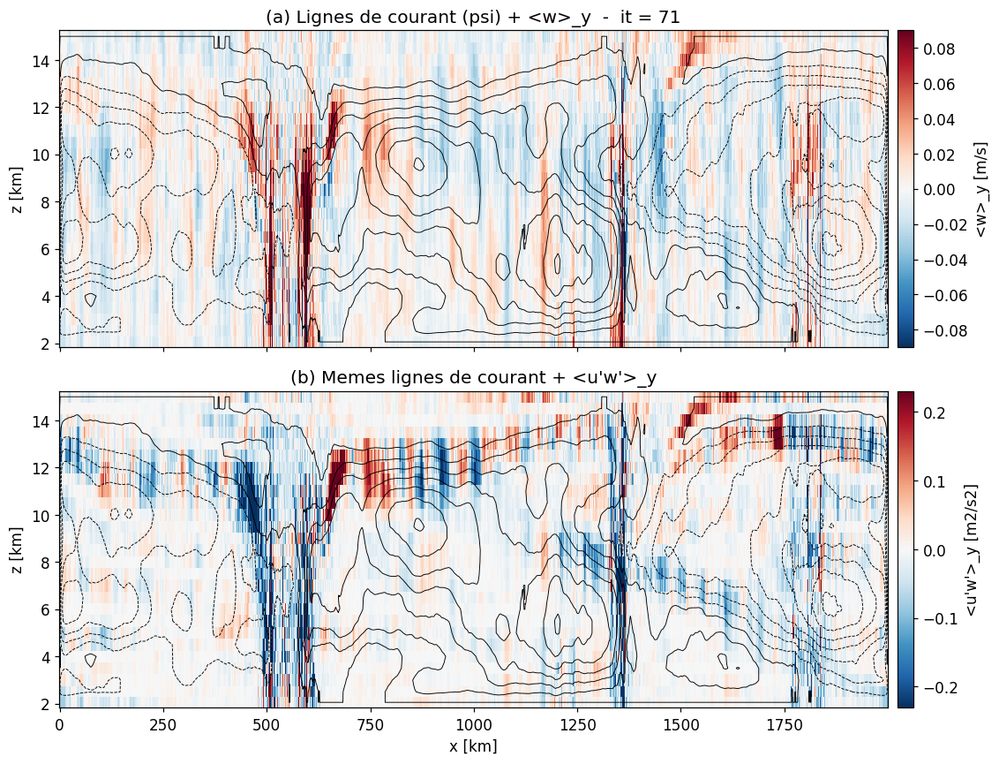

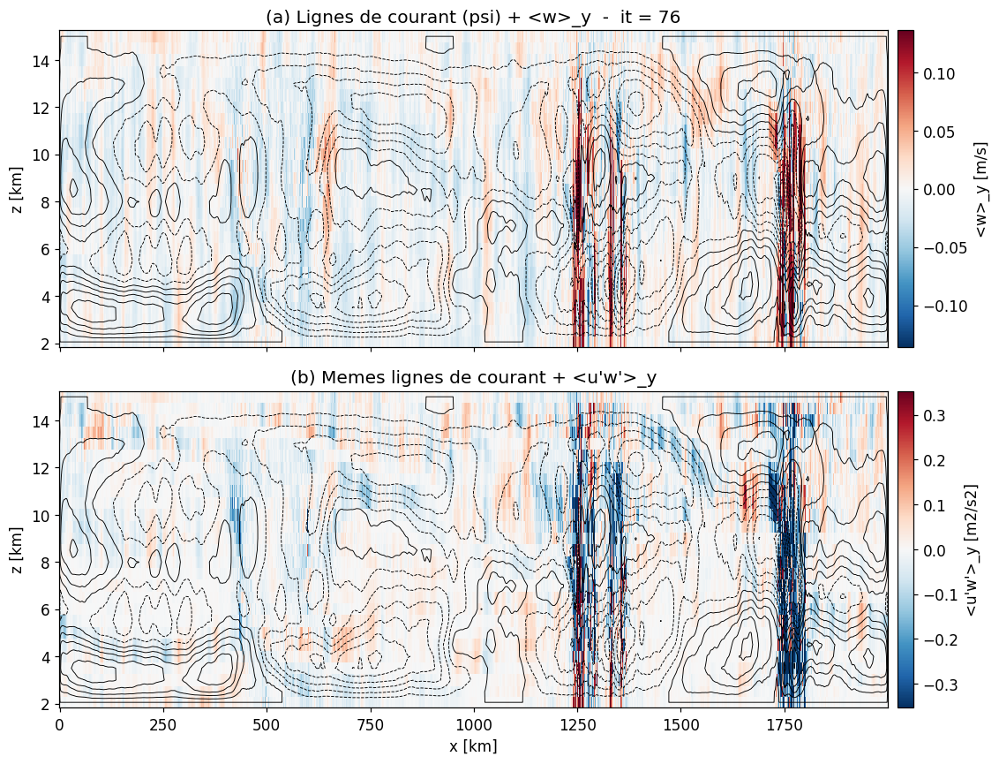

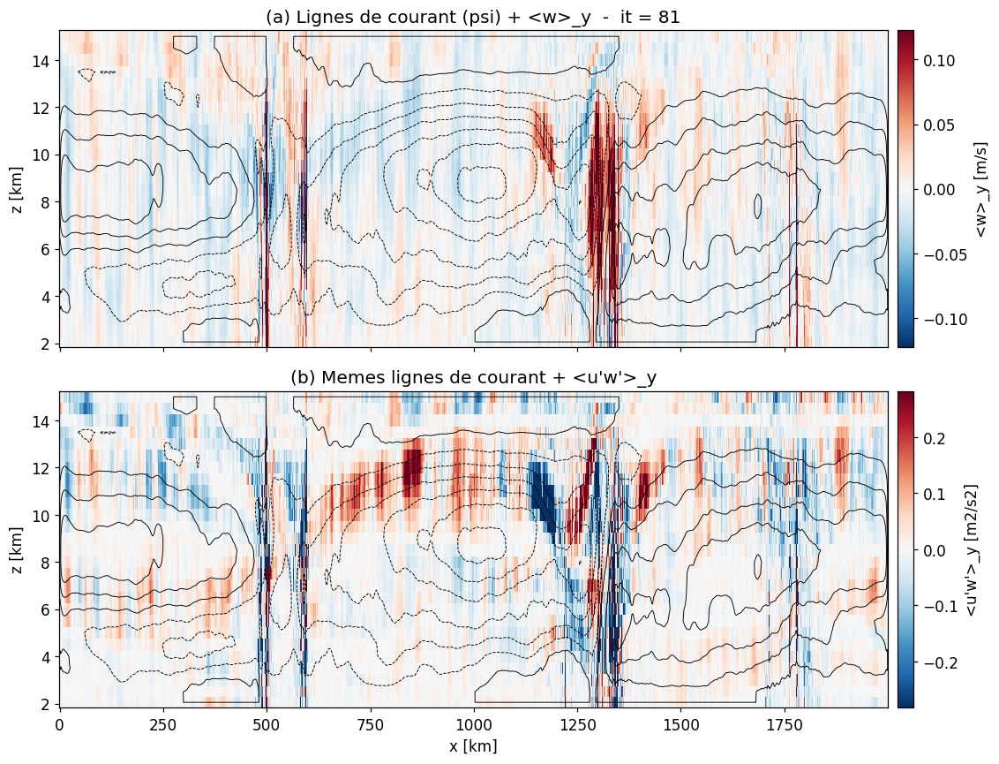

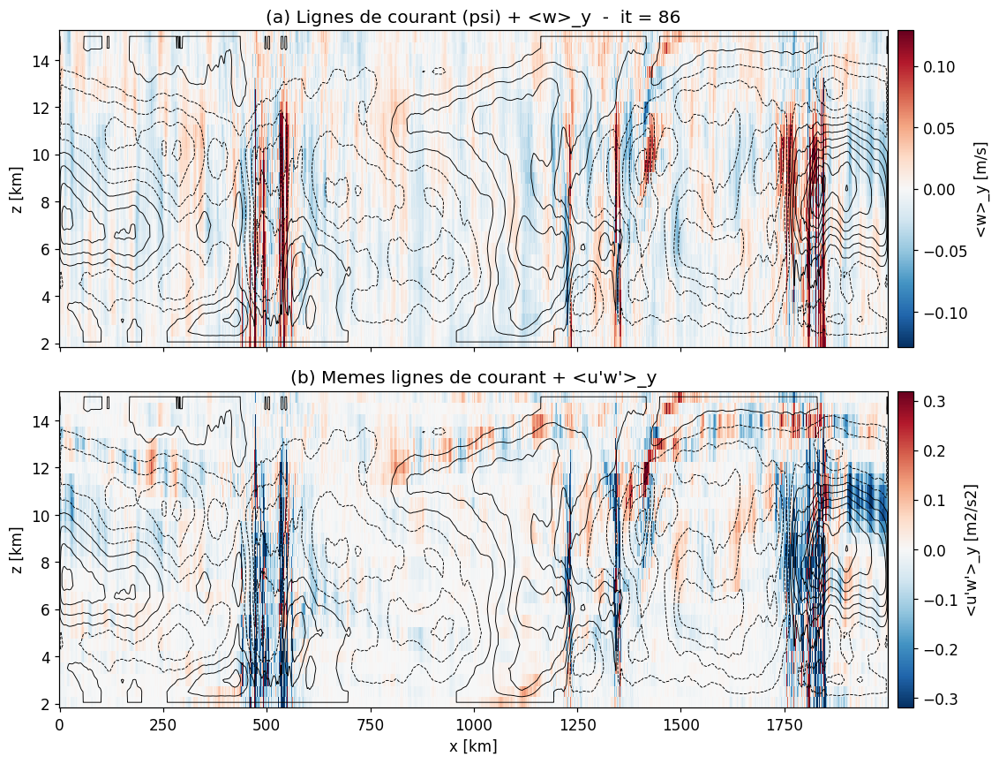

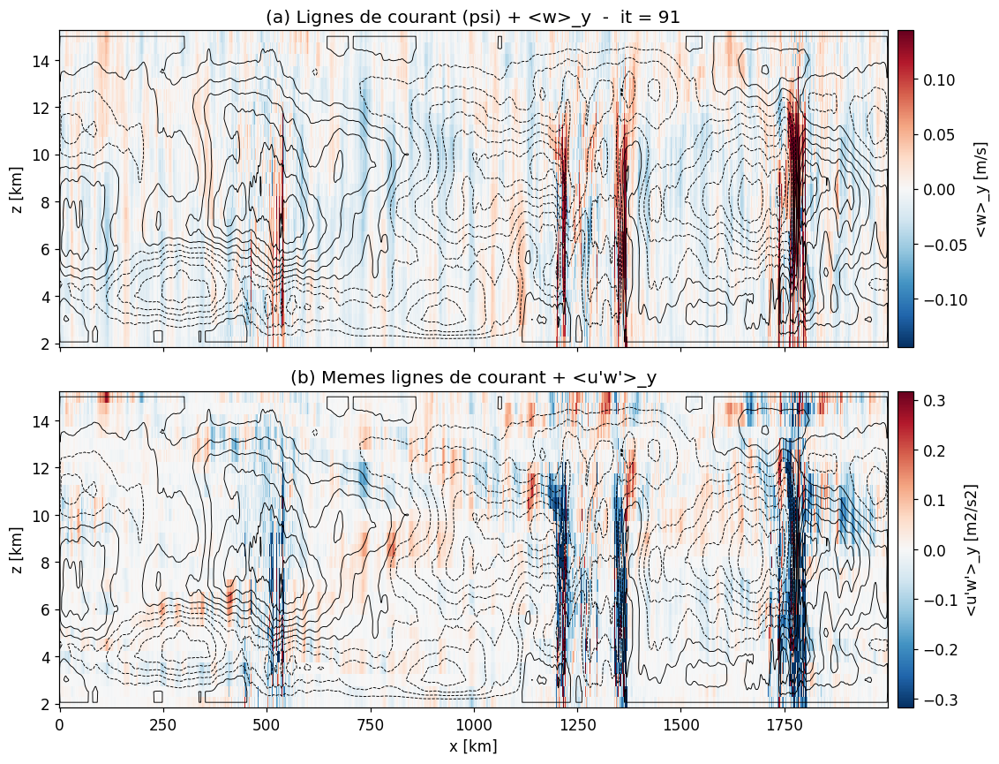

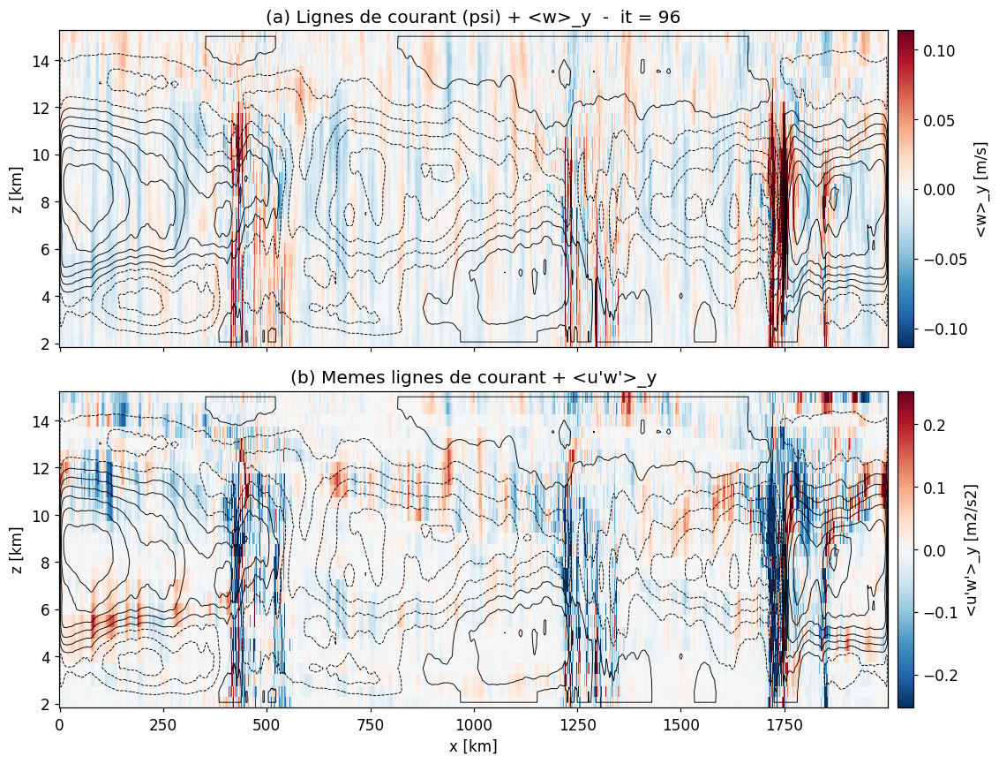

In [8]:
# ======================================================================
#  Coupes (z,x) à des instants t donnés — moyennées sur y SEULEMENT
#  Version autonome : ne dépend que de dim_t, dim_z, dim_x, n_t, n_x,
#  alt, t_stat, n_stat, x, path3d. Recalcule rho0 et tout le reste.
# ======================================================================
from scipy.sparse import diags, kron, identity
from scipy.sparse.linalg import spsolve

ZMIN, ZMAX = 2000., 15000.
T_SNAPS = list(range(t_stat, n_t, 5))   # instants à tracer

# --- rho0 sur la grille COMPLETE (au cas où il aurait été tronqué ailleurs) ---
_nz_full = alt.size
rho0_full = np.zeros(_nz_full); _nr = 0
_da = xr.open_dataset(path3d('ta')); _dp = xr.open_dataset(path3d('pa')); _dh = xr.open_dataset(path3d('hus'))
for t0 in range(t_stat, n_t, BLOC):
    t1 = min(t0+BLOC, n_t); sl = {dim_t: slice(t0,t1)}
    T = _da['ta'].isel(sl).values; P = _dp['pa'].isel(sl).values; Q = _dh['hus'].isel(sl).values
    Tv = T*(1.0+Q/EPSILON)/(1.0+Q)
    rho0_full += (P/(Rd*Tv)).mean(axis=(0,2,3))*(t1-t0); _nr += (t1-t0)
    del T,P,Q,Tv; gc.collect()
_da.close(); _dp.close(); _dh.close(); del _da,_dp,_dh; gc.collect()
rho0_full /= _nr

kz = (alt >= ZMIN) & (alt <= ZMAX)        # masque vertical 2-18 km

def coupe_instant(it):
    U_i = np.zeros((_nz_full, n_x)); W_i = np.zeros((_nz_full, n_x)); UP_i = np.zeros((_nz_full, n_x))
    du = xr.open_dataset(path3d('ua')); dw = xr.open_dataset(path3d('wa'))
    for iz in range(_nz_full):
        u_yx = du['ua'].isel({dim_t: it, dim_z: iz}).values
        w_yx = dw['wa'].isel({dim_t: it, dim_z: iz}).values
        u_p = u_yx - u_yx.mean(); w_p = w_yx - w_yx.mean()
        U_i[iz] = u_yx.mean(axis=0); W_i[iz] = w_yx.mean(axis=0)
        UP_i[iz] = (u_p*w_p).mean(axis=0)
        del u_yx, w_yx, u_p, w_p
    du.close(); dw.close(); del du, dw; gc.collect()
    return alt[kz], rho0_full[kz], U_i[kz], W_i[kz], UP_i[kz]

def psi_poisson(U_i, W_i, x, z_i, rho_i):
    nz, nx = U_i.shape
    dxl = float(x[1]-x[0]); dzl = float(z_i[1]-z_i[0])
    rhoU = rho_i[:,None]*U_i; rhoW = rho_i[:,None]*W_i
    omega = np.gradient(rhoW, dxl, axis=1) - np.gradient(rhoU, dzl, axis=0)
    Ix = identity(nx-2); Iz = identity(nz-2)
    Lx = diags([1.,-2.,1.],[-1,0,1],shape=(nx-2,nx-2))/dxl**2
    Lz = diags([1.,-2.,1.],[-1,0,1],shape=(nz-2,nz-2))/dzl**2
    A = (kron(Iz,Lx)+kron(Lz,Ix)).tocsr()
    psi = np.zeros((nz,nx))
    psi[1:-1,1:-1] = spsolve(A, omega[1:-1,1:-1].ravel()).reshape(nz-2,nx-2)
    return psi

for it in T_SNAPS:
    z_i, rho_i, U_i, W_i, UP_i = coupe_instant(it)
    psi_i = psi_poisson(U_i, W_i, x, z_i, rho_i)
    Xkm, Zkm = x/1000, z_i/1000

    fig, axes = plt.subplots(2, 1, figsize=(11, 8), sharex=True)
    ax = axes[0]
    wmax = np.percentile(np.abs(W_i), 99) + 1e-12
    pc = ax.pcolormesh(Xkm, Zkm, W_i, shading='auto',
                       norm=TwoSlopeNorm(vcenter=0, vmin=-wmax, vmax=wmax), cmap='RdBu_r')
    ax.contour(Xkm, Zkm, psi_i, levels=14, colors='k', linewidths=0.6)
    ax.set_title(f"(a) Lignes de courant (psi) + <w>_y  -  it = {it}")
    ax.set_ylabel('z [km]'); fig.colorbar(pc, ax=ax, label='<w>_y [m/s]', pad=0.01)

    ax = axes[1]
    fmax = np.percentile(np.abs(UP_i), 98) + 1e-12
    pc = ax.pcolormesh(Xkm, Zkm, UP_i, shading='auto',
                       norm=TwoSlopeNorm(vcenter=0, vmin=-fmax, vmax=fmax), cmap='RdBu_r')
    ax.contour(Xkm, Zkm, psi_i, levels=14, colors='k', linewidths=0.6)
    ax.set_title("(b) Memes lignes de courant + <u'w'>_y")
    ax.set_xlabel('x [km]'); ax.set_ylabel('z [km]')
    fig.colorbar(pc, ax=ax, label="<u'w'>_y [m2/s2]", pad=0.01)
    plt.tight_layout(); plt.show()

/tmp/ipykernel_36332/4272808434.py:7: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pc = ax.pcolormesh(Xkm, Zkm, W, shading='auto',
/tmp/ipykernel_36332/4272808434.py:17: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pc = ax.pcolormesh(Xkm, Zkm, upwp, shading='auto',


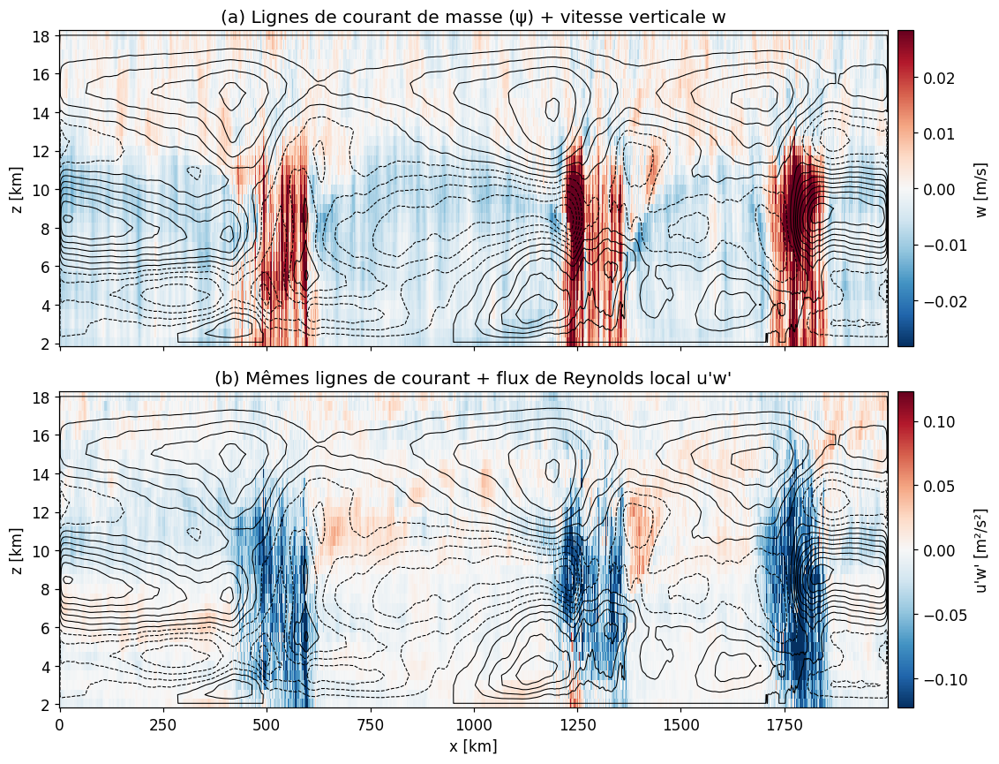

In [9]:
fig, axes = plt.subplots(2, 1, figsize=(11, 8), sharex=True)
Xkm, Zkm = x/1000, z/1000

# --- (a) lignes de courant + vitesse verticale
ax = axes[0]
wmax = np.percentile(np.abs(W), 98) + 1e-12
pc = ax.pcolormesh(Xkm, Zkm, W, shading='auto',
                   norm=TwoSlopeNorm(vcenter=0, vmin=-wmax, vmax=wmax), cmap='RdBu_r')
cs = ax.contour(Xkm, Zkm, psi, levels=14, colors='k', linewidths=0.7)
ax.set_title("(a) Lignes de courant de masse (ψ) + vitesse verticale w")
ax.set_ylabel('z [km]')
fig.colorbar(pc, ax=ax, label='w [m/s]', pad=0.01)

# --- (b) lignes de courant + flux de Reynolds u'w'
ax = axes[1]
vmax = np.percentile(np.abs(upwp), 98)
pc = ax.pcolormesh(Xkm, Zkm, upwp, shading='auto',
                   norm=TwoSlopeNorm(vcenter=0, vmin=-vmax, vmax=vmax), cmap='RdBu_r')
ax.contour(Xkm, Zkm, psi, levels=14, colors='k', linewidths=0.7)
ax.set_title("(b) Mêmes lignes de courant + flux de Reynolds local u'w'")
ax.set_xlabel('x [km]');  ax.set_ylabel('z [km]')
fig.colorbar(pc, ax=ax, label="u'w' [m²/s²]", pad=0.01)
plt.tight_layout();  plt.show()

## 4. Que tirer de la visualisation ? — diagnostics quantitatifs

On quantifie l'intuition « organisation forte / corrélation faible » :
- **Coefficient de corrélation** $r(z) = \dfrac{\langle u'w'\rangle}{\sigma_u\,\sigma_w}$ par niveau : si $|r|\ll 1$, le transport net est faible *malgré* des $u',w'$ d'amplitude marquée.
- **Taux d'annulation spatiale** : $1 - \dfrac{|\int u'w'\,dx|}{\int |u'w'|\,dx}$ par niveau. Proche de 1 = les contributions se compensent spatialement (signature visuelle de la « faible corrélation »).

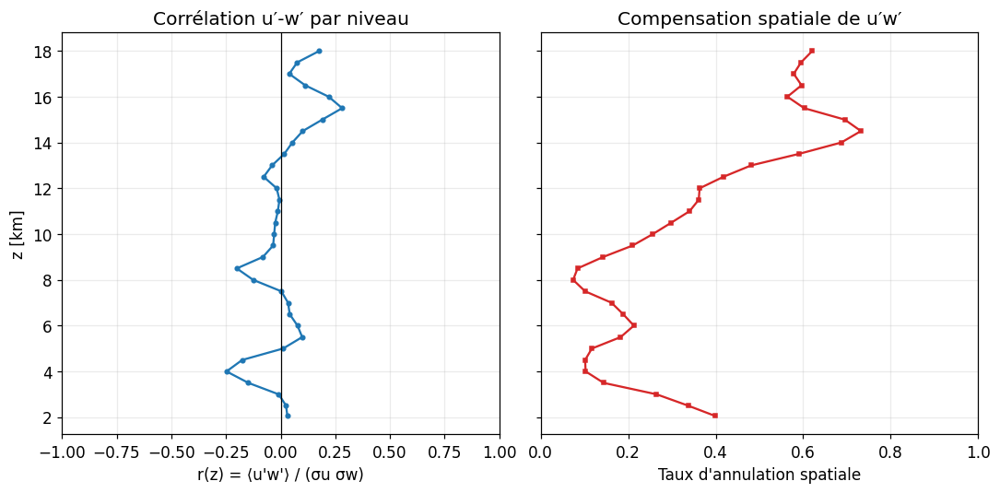

|r| médian = 0.054  (faible corrélation confirmée si ≪ 1)


In [10]:
# r(z) de la STRUCTURE ORGANISÉE (champ moyenné en y) : corrélation entre
# les ondulations en x de U et W. C'est la corrélation 'visible' à grande
# échelle — à comparer au vrai <u'w'> sous-maille (UPWP, calculé en 1c).
Up = U - U.mean(axis=1, keepdims=True)
Wp = W - W.mean(axis=1, keepdims=True)
cov  = (Up*Wp).mean(axis=1)
su   = Up.std(axis=1);  sw = Wp.std(axis=1)
r_z  = cov/(su*sw + 1e-30)

cancel = 1 - np.abs(upwp.sum(axis=1))/(np.abs(upwp).sum(axis=1)+1e-30)

fig, ax = plt.subplots(1, 2, figsize=(10,5), sharey=True)
ax[0].plot(r_z, Zkm, 'o-', ms=3)
ax[0].axvline(0, color='k', lw=0.8)
ax[0].set_xlabel("r(z) = ⟨u'w'⟩ / (σu σw)");  ax[0].set_ylabel('z [km]')
ax[0].set_title('Corrélation u\u2032-w\u2032 par niveau')
ax[0].set_xlim(-1, 1)

ax[1].plot(cancel, Zkm, 's-', ms=3, color='C3')
ax[1].set_xlabel('Taux d\'annulation spatiale')
ax[1].set_title('Compensation spatiale de u\u2032w\u2032')
ax[1].set_xlim(0, 1)
plt.tight_layout();  plt.show()

print(f"|r| médian = {np.median(np.abs(r_z)):.3f}  "
      f"(faible corrélation confirmée si ≪ 1)")

## 5. Lien avec la paramétrisation du flux de Reynolds

Rappel de ton résultat : $\Phi_{rey}=T_1+T_2$, $T_1$ = transport par flux de masse organisé, $T_2$ = covariance sous-maille (≈44 %, $r\approx+0.99$ avec $\Phi_{rey}$).

**Ce que les lignes de courant ajoutent** : elles montrent *où* dans le plan $(x,z)$ le transport organisé ($T_1$) est aligné avec la cellule, et où $u'w'$ s'écarte du cadre flux-de-masse. On peut superposer le **vecteur flux de masse** $(\rho_0\bar u,\rho_0\bar w)$ et regarder l'angle avec le **gradient** de $\bar u$ : une fermeture down-gradient suppose $\overline{u'w'}\propto-\partial_z\bar u$. Tracer cet angle révèle les zones de **contre-gradient** (up-gradient) — typiques du transport convectif organisé que le mélange turbulent ne capture pas.

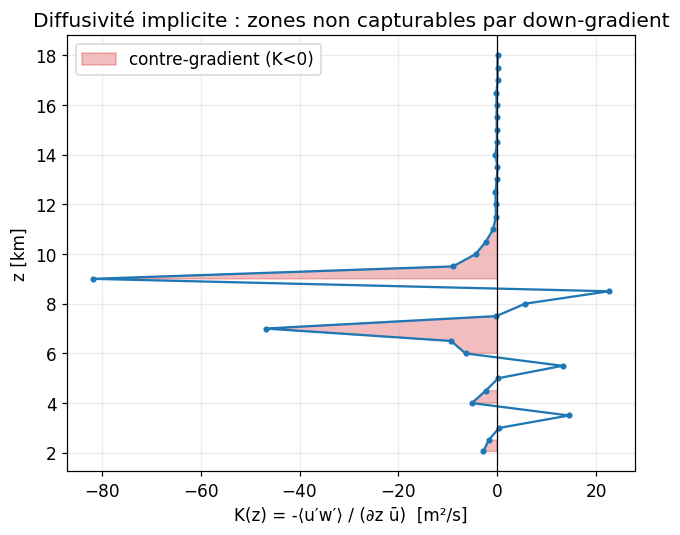

In [11]:
ubar_z = U.mean(axis=1)
dudz = np.gradient(ubar_z, z)
# flux moyen par niveau
flux_z = (Up*Wp).mean(axis=1)
# diffusivité turbulente implicite K = -flux/(du/dz) ; K<0 => contre-gradient
K = -flux_z/(dudz + 1e-30)

fig, ax = plt.subplots(figsize=(6,5))
ax.plot(K, Zkm, 'o-', ms=3)
ax.axvline(0, color='k', lw=0.8)
ax.fill_betweenx(Zkm, K, 0, where=(K<0), color='C3', alpha=0.3,
                 label='contre-gradient (K<0)')
ax.set_xlabel('K(z) = -⟨u\u2032w\u2032⟩ / (∂z ū)  [m²/s]')
ax.set_ylabel('z [km]');  ax.legend()
ax.set_title('Diffusivité implicite : zones non capturables par down-gradient')
plt.tight_layout();  plt.show()

## 6. Décomposition en échelles — Fourier & ondelettes

Objectif : **quelles échelles horizontales portent le transport $u'w'$ ?** Si le co-spectre $\widehat{u'w'}(k)$ est dominé par les grandes échelles (cellule), une approche flux-de-masse a une chance ; s'il est large-bande, il faut une approche multi-échelle.

Tu maîtrises déjà les ondelettes (DWT, OMP/OLS) — ici on commence par le **co-spectre de Fourier** (rapide, interprétable), puis une **ondelette continue (CWT)** pour localiser spatialement les structures porteuses de flux.

/tmp/ipykernel_36332/1986632380.py:23: RuntimeWarning: divide by zero encountered in divide
  wavelength_km = np.where(kx>0, 1/kx/1000, np.nan)


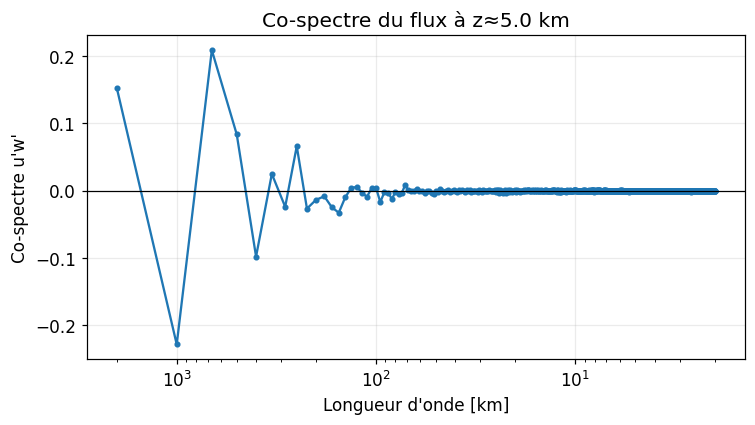

Échelle dominante du flux : 1000.0 km


In [12]:
# --- Co-spectre de Fourier du VRAI flux u'w', moyenné sur y ---
# On utilise les tranches 2D (y,x) gardées en 1c (slices2d) au lieu du
# champ moyenné en y (qui n'est PAS le flux). Le co-spectre est moyenné
# sur les lignes y. En synthétique, on retombe sur la coupe (pas de slices2d).
if not USE_SYNTHETIC and len(slices2d) > 0:
    iz_sel = iz_targets[0]                       # ~5 km
    up2d, wp2d = slices2d[iz_sel]                # (ny, nx)
    n = up2d.shape[1]
    Uf = np.fft.rfft(up2d, axis=1)
    Wf = np.fft.rfft(wp2d, axis=1)
    cospec = (Uf*np.conj(Wf)).real.mean(axis=0) / n   # moyenne sur y
    z_sel = alt[iz_sel]
else:
    iz_sel = int(np.argmin(np.abs(z - 5000.)))
    up = (U - U.mean(axis=1, keepdims=True))[iz_sel]
    wp = (W - W.mean(axis=1, keepdims=True))[iz_sel]
    n = len(up)
    Uf = np.fft.rfft(up);  Wf = np.fft.rfft(wp)
    cospec = (Uf*np.conj(Wf)).real / n
    z_sel = z[iz_sel]

kx = np.fft.rfftfreq(n, d=dx)
wavelength_km = np.where(kx>0, 1/kx/1000, np.nan)

fig, ax = plt.subplots(figsize=(7,4))
ax.semilogx(wavelength_km[1:], cospec[1:], 'o-', ms=3)
ax.axhline(0, color='k', lw=0.8)
ax.set_xlabel('Longueur d\'onde [km]');  ax.set_ylabel("Co-spectre u'w'")
ax.set_title(f"Co-spectre du flux à z\u2248{z_sel/1000:.1f} km")
ax.invert_xaxis()
plt.tight_layout();  plt.show()

imax = 1 + int(np.argmax(np.abs(cospec[1:])))
print(f'\u00c9chelle dominante du flux : {wavelength_km[imax]:.1f} km')

In [13]:
# --- CWT (Morlet) : localisation spatiale du flux le long de x ---
# Co-scalogramme = u'(x)*w'(x) en ondelettes, sur une ligne y représentative.
try:
    import pywt
    if not USE_SYNTHETIC and len(slices2d) > 0:
        up2d, wp2d = slices2d[iz_sel]
        # ligne y de flux maximal (la plus 'active')
        jy = int(np.argmax(np.abs((up2d*wp2d)).sum(axis=1)))
        up_line, wp_line = up2d[jy], wp2d[jy]
    else:
        up_line = (U - U.mean(axis=1, keepdims=True))[iz_sel]
        wp_line = (W - W.mean(axis=1, keepdims=True))[iz_sel]
    nL = len(up_line)
    scales = np.geomspace(2, nL//4, 60)
    cwt_u, freqs = pywt.cwt(up_line, scales, 'morl', sampling_period=dx)
    cwt_w, _     = pywt.cwt(wp_line, scales, 'morl', sampling_period=dx)
    cocwt = cwt_u*cwt_w
    wl_km = 1/freqs/1000
    xx_km = np.arange(nL)*dx/1000

    fig, ax = plt.subplots(figsize=(11,4))
    vmax = np.percentile(np.abs(cocwt), 98) + 1e-12
    pc = ax.pcolormesh(xx_km, wl_km, cocwt, shading='auto',
                       norm=TwoSlopeNorm(vcenter=0,vmin=-vmax,vmax=vmax), cmap='RdBu_r')
    ax.set_yscale('log');  ax.set_ylabel('Longueur d\'onde [km]')
    ax.set_xlabel('x [km]')
    ax.set_title(f"Co-scalogramme u'w' \u2014 z\u2248{z_sel/1000:.1f} km (où et à quelle échelle le flux est porté)")
    fig.colorbar(pc, ax=ax, label="contribution locale à u'w'")
    plt.tight_layout();  plt.show()
except ImportError:
    print('pywt non installé : pip install PyWavelets')

pywt non installé : pip install PyWavelets


## 7. Extension aux lignes de courant 3D

En 3D la fonction de courant scalaire n'existe plus (il faudrait un vecteur). On visualise donc directement les **trajectoires d'intégration** du champ $(u,v,w)$ — *streamlines 3D* — à un instant. Utile pour voir les **rouleaux / cellules** de l'auto-agrégation.

Approche légère : intégrateur RK4 sur le champ interpolé, quelques graines, rendu 3D matplotlib. (Pour de gros volumes, préférer `pyvista`/ParaView.)

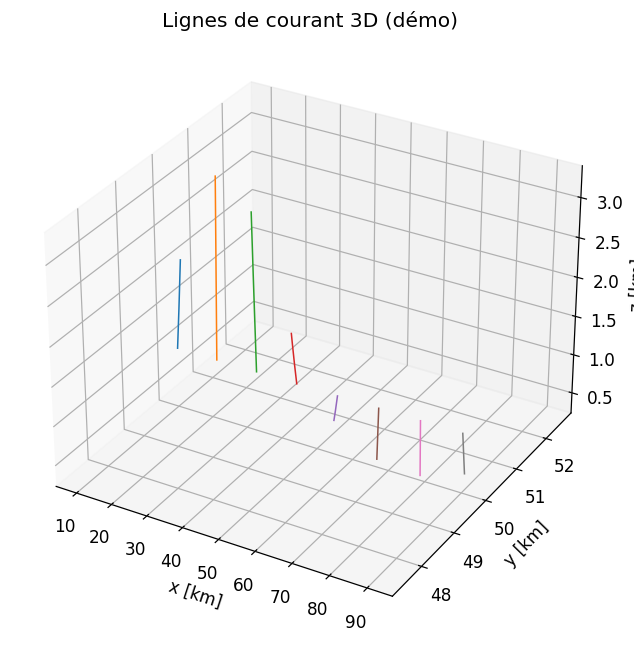

In [14]:
from scipy.interpolate import RegularGridInterpolator

def streamlines_3d(U3, V3, W3, x, y, z, seeds, n_steps=400, dt=20.):
    """Intègre des lignes de courant 3D par RK4. U3,V3,W3 de forme (nz,ny,nx)."""
    pts = (z, y, x)
    fu = RegularGridInterpolator(pts, U3, bounds_error=False, fill_value=0)
    fv = RegularGridInterpolator(pts, V3, bounds_error=False, fill_value=0)
    fw = RegularGridInterpolator(pts, W3, bounds_error=False, fill_value=0)
    def vel(p):
        q = p[:, [2,1,0]]  # -> (z,y,x)
        return np.stack([fu(q), fv(q), fw(q)], axis=1)
    lines = []
    for s in seeds:
        p = np.array(s, float)[None,:];  traj=[p[0].copy()]
        for _ in range(n_steps):
            k1=vel(p); k2=vel(p+0.5*dt*k1); k3=vel(p+0.5*dt*k2); k4=vel(p+dt*k3)
            p = p + dt/6*(k1+2*k2+2*k3+k4)
            traj.append(p[0].copy())
        lines.append(np.array(traj))
    return lines

# Démo 3D synthétique (petit volume)
nz3,ny3,nx3 = 30,40,40
zc=np.linspace(0,2e4,nz3); yc=np.linspace(0,1e5,ny3); xc=np.linspace(0,1e5,nx3)
Zc,Yc,Xc=np.meshgrid(zc,yc,xc,indexing='ij')
U3= np.sin(np.pi*Zc/2e4)*np.cos(2*np.pi*Xc/1e5)
V3= 0.3*np.sin(2*np.pi*Yc/1e5)
W3= np.sin(np.pi*Zc/2e4)*np.sin(2*np.pi*Xc/1e5)
seeds=[(xs,5e4,1e3) for xs in np.linspace(1e4,9e4,8)]
lines=streamlines_3d(U3,V3,W3,xc,yc,zc,seeds)

fig=plt.figure(figsize=(8,6)); ax=fig.add_subplot(111,projection='3d')
for L in lines:
    ax.plot(L[:,0]/1e3, L[:,1]/1e3, L[:,2]/1e3, lw=1)
ax.set_xlabel('x [km]'); ax.set_ylabel('y [km]'); ax.set_zlabel('z [km]')
ax.set_title('Lignes de courant 3D (démo)')
plt.tight_layout(); plt.show()

## 8. Isolation des tourbillons — critère $\lambda_2$ / Okubo-Weiss

Pour isoler les tourbillons dans la coupe $(x,z)$, on utilise le **critère $Q$ / Okubo-Weiss 2D** : un point est dans un cœur tourbillonnaire si la rotation domine la déformation, i.e. 
$$W_{OW} = s_n^2 + s_s^2 - \omega^2 < 0,$$
avec $s_n=\partial_x u-\partial_z w$ (étirement normal), $s_s=\partial_z u+\partial_x w$ (cisaillement), $\omega=\partial_x w-\partial_z u$ (vorticité). Les zones $W_{OW}<0$ marquent les tourbillons.

/tmp/ipykernel_36332/1897455673.py:8: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pc=ax.pcolormesh(Xkm,Zkm,omega,shading='auto',


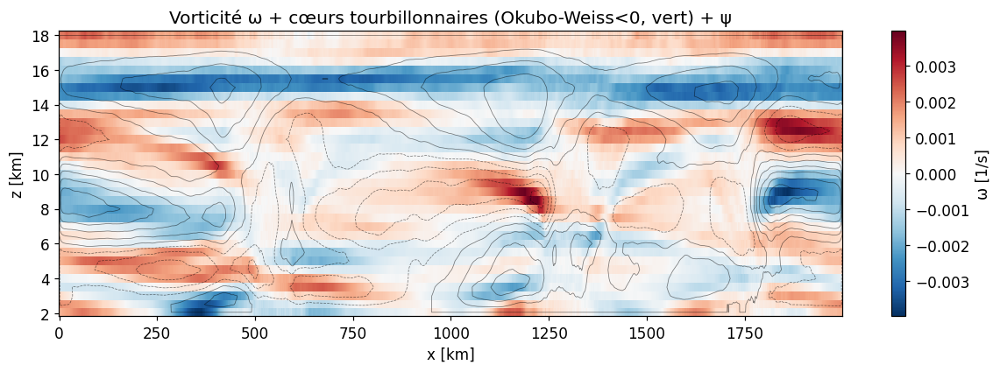

In [15]:
dudx=np.gradient(U,x,axis=1); dudz=np.gradient(U,z,axis=0)
dwdx=np.gradient(W,x,axis=1); dwdz=np.gradient(W,z,axis=0)
sn=dudx-dwdz; ss=dudz+dwdx; omega=dwdx-dudz
OW=sn**2+ss**2-omega**2
thr=-0.2*np.std(OW)

fig,ax=plt.subplots(figsize=(11,4))
pc=ax.pcolormesh(Xkm,Zkm,omega,shading='auto',
                 norm=TwoSlopeNorm(vcenter=0),cmap='RdBu_r')
#ax.contour(Xkm,Zkm,OW,levels=[thr],colors='lime',linewidths=1.5)
ax.contour(Xkm,Zkm,psi,levels=12,colors='k',linewidths=0.5,alpha=0.5)
ax.set_xlabel('x [km]');ax.set_ylabel('z [km]')
ax.set_title('Vorticité ω + cœurs tourbillonnaires (Okubo-Weiss<0, vert) + ψ')
fig.colorbar(pc,ax=ax,label='ω [1/s]')
plt.tight_layout();plt.show()

/tmp/ipykernel_36332/1213772963.py:8: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pc=ax.pcolormesh(Xkm,Zkm,omega,shading='auto',


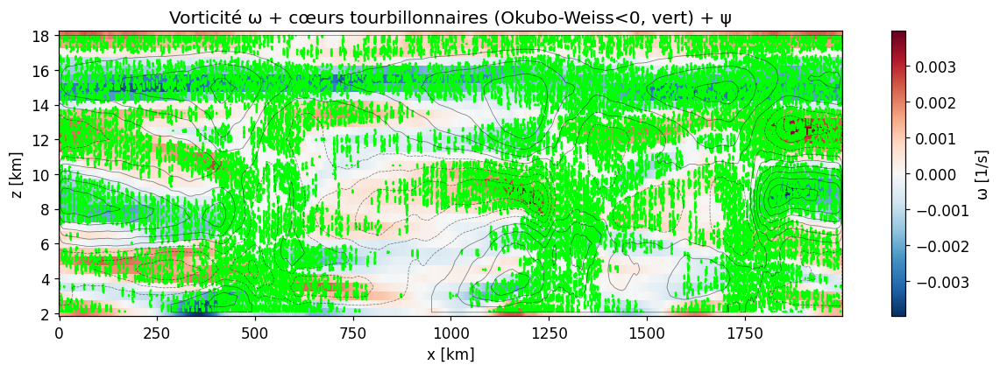

In [16]:
dudx=np.gradient(U,x,axis=1); dudz=np.gradient(U,z,axis=0)
dwdx=np.gradient(W,x,axis=1); dwdz=np.gradient(W,z,axis=0)
sn=dudx-dwdz; ss=dudz+dwdx; omega=dwdx-dudz
OW=sn**2+ss**2-omega**2
thr=-0.2*np.std(OW)

fig,ax=plt.subplots(figsize=(11,4))
pc=ax.pcolormesh(Xkm,Zkm,omega,shading='auto',
                 norm=TwoSlopeNorm(vcenter=0),cmap='RdBu_r')

ax.contour(Xkm,Zkm,OW,levels=[thr],colors='lime',linewidths=1.5)
ax.contour(Xkm,Zkm,psi,levels=12,colors='k',linewidths=0.5,alpha=0.5)
ax.set_xlabel('x [km]');ax.set_ylabel('z [km]')
ax.set_title('Vorticité ω + cœurs tourbillonnaires (Okubo-Weiss<0, vert) + ψ')
fig.colorbar(pc,ax=ax,label='ω [1/s]')
plt.tight_layout();plt.show()

## 9. Autres idées 

Quelques diagnostics complémentaires qui s'inscrivent dans l'objectif *« comprendre pourquoi $u'w'$ échappe au flux de masse »* :

1. **Analyse en quadrants** (Q1–Q4) du flux $u'w'$ : décompose le transport en éjections ($u'<0,w'>0$) vs balayages ($u'>0,w'<0$). Permet de voir si le flux net faible vient d'un quasi-équilibre entre quadrants — signature directe de la « faible corrélation ».
2. **Angle de phase $u'$–$w'$** par niveau : un déphasage proche de $90°$ explique une covariance nulle malgré des amplitudes fortes.
3. **Moyenne temporelle** des lignes de courant sur plusieurs $t$ : isole la circulation *stationnaire* (overturning d'agrégation) du transitoire turbulent.
4. **Conditionnement par cœur tourbillonnaire** : recalculer $T_1$/$T_2$ *dans* vs *hors* tourbillons (réutilise ton framework up/dn/env).

Ci-dessous : l'analyse en quadrants, la plus directement reliée à ta problématique.

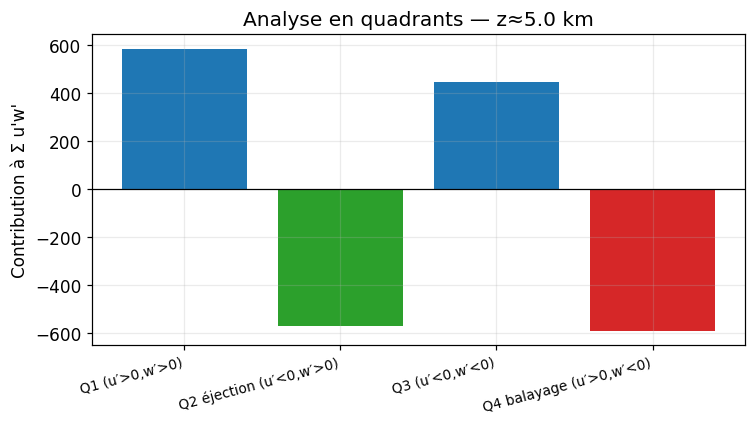

Flux net / flux brut = -5.78%  (proche de 0 => forte compensation entre quadrants)


In [17]:
# Analyse en quadrants sur le VRAI champ 2D (y,x) au niveau cible iz_sel
if not USE_SYNTHETIC and len(slices2d) > 0:
    up2d, wp2d = slices2d[iz_sel]
    up = up2d.ravel();  wp = wp2d.ravel();  z_q = alt[iz_sel]
else:
    kq = int(np.argmin(np.abs(z - 5000.)))
    up = (U - U.mean(axis=1, keepdims=True))[kq]
    wp = (W - W.mean(axis=1, keepdims=True))[kq];  z_q = z[kq]
fl = up*wp
Q={'Q1 (u\u2032>0,w\u2032>0)':(up>0)&(wp>0),
   'Q2 éjection (u\u2032<0,w\u2032>0)':(up<0)&(wp>0),
   'Q3 (u\u2032<0,w\u2032<0)':(up<0)&(wp<0),
   'Q4 balayage (u\u2032>0,w\u2032<0)':(up>0)&(wp<0)}
contrib={kk:fl[m].sum() for kk,m in Q.items()}

fig,ax=plt.subplots(figsize=(7,4))
ax.bar(range(4),list(contrib.values()), color=['C0','C2','C0','C3'])
ax.set_xticks(range(4)); ax.set_xticklabels(list(contrib.keys()),rotation=15,ha='right',fontsize=9)
ax.axhline(0,color='k',lw=0.8)
ax.set_ylabel("Contribution à Σ u'w'")
ax.set_title(f'Analyse en quadrants \u2014 z\u2248{z_q/1000:.1f} km')
plt.tight_layout();plt.show()

net=sum(contrib.values()); gross=sum(abs(v) for v in contrib.values())+1e-30
print(f'Flux net / flux brut = {net/gross:+.2%}  '
      '(proche de 0 => forte compensation entre quadrants)')